In [1]:
# You can also use this section to suppress warnings generated by your code:
def warn(*args, **kwargs):
    pass


import warnings
warnings.warn = warn
warnings.filterwarnings('ignore')

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' # tensorflow INFO and WARNING messages are not printed

In [2]:
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

import PIL
from PIL import Image, ImageOps
import tensorflow as tf

import glob
from tensorflow import keras
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense

from tensorflow.keras.utils import plot_model

In [3]:
dataset_url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML311-Coursera/labs/Module3/L1/flower_photos.tgz"
data_dir = keras.utils.get_file(origin=dataset_url,
                                fname='flower_photos',
                                untar=True)

data_dir = pathlib.Path(data_dir)

for folder in data_dir.glob('[!LICENSE]*'):
    print('The', folder.name, 'folder has',
          len(list(folder.glob('*.jpg'))), 'pictures')
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count, 'total images')

228813984/228813984 [==============================] - 11s 0us/step
The tulips folder has 799 pictures
The sunflowers folder has 699 pictures
The daisy folder has 633 pictures
The roses folder has 641 pictures
The dandelion folder has 898 pictures
3670 total images


In [4]:
data_dir

PosixPath('/root/.keras/datasets/flower_photos')

In [5]:
print(data_dir)
for idx, folder in enumerate(data_dir.glob('[!LICENSE]*')):
    print(idx,folder)

print(len(list(data_dir.glob("*/*.jpg"))))

/root/.keras/datasets/flower_photos
0 /root/.keras/datasets/flower_photos/tulips
1 /root/.keras/datasets/flower_photos/sunflowers
2 /root/.keras/datasets/flower_photos/daisy
3 /root/.keras/datasets/flower_photos/roses
4 /root/.keras/datasets/flower_photos/dandelion
3670


#### Exercise: Define the model and add the first layer

Define the Sequential model and add the following layer to our classifier:

1.  Convolutional layer with 3 input channels, three 3x3 filters, even padding, and relu activation function.


In [6]:
# print(len(data) , len(label))

In [7]:
# data[:5]

In [8]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator


In [9]:
import numpy as np
from collections import Counter

In [10]:
# data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    # rescale = 1/255,
    fill_mode='nearest'
)

In [16]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    seed=123,
    batch_size=32
)


Found 3670 files belonging to 5 classes.


In [17]:
import matplotlib.pyplot as plt

In [18]:
LABELS = dataset.class_names
LABELS

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

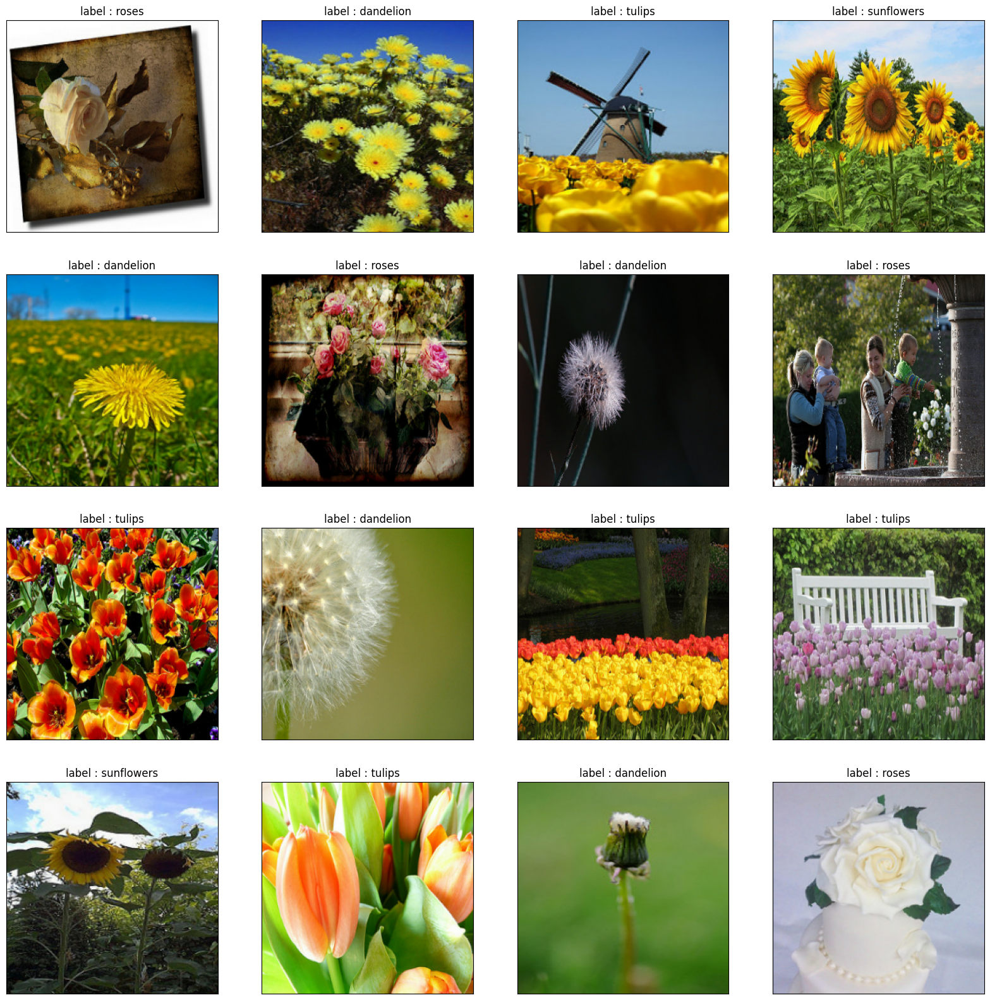

In [19]:
for b in dataset.take(1):
  imgs, labels = b
  plt.figure(figsize=(20, 20))
  for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(imgs[i].numpy().astype('uint16'))
    plt.title(f"label : {LABELS[labels[i]]}")
    plt.xticks([])
    plt.yticks([])
  plt.show()
  break

In [22]:
import datetime
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from keras import regularizers
from keras.optimizers import Adam,SGD
from keras.layers import Dropout,GlobalAveragePooling2D,GlobalMaxPooling2D
from keras.regularizers import l2,l1,l1_l2
loss_function_used = SparseCategoricalCrossentropy()

In [23]:
from tensorflow.keras.layers.experimental.preprocessing import Rescaling, Resizing

In [24]:
input_shape=(256,256,3)
base_model = tf.keras.applications.xception.Xception(
    include_top=False,
    weights='imagenet',
    input_tensor=None,
    input_shape=input_shape,
    pooling=None,
    classifier_activation='softmax'
)
base_model.trainable = False

83683744/83683744 [==============================] - 1s 0us/step


In [27]:
preprocess_input = tf.keras.applications.xception.preprocess_input

In [54]:
inputs = keras.Input(shape=input_shape)

x = base_model(preprocess_input(inputs) , training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
# avg_pool = GlobalAveragePooling2D()(x)

x = GlobalMaxPooling2D()(x)
custom_net = Dense(1028 , activation = 'relu')(x)
# custom_net = Dense(128)(custom_net)
outputs = Dense(5 , activation = 'softmax')(custom_net)
classifier = Model(inputs, outputs)

In [55]:
classifier.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 tf.math.truediv_3 (TFOpLam  (None, 256, 256, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_3 (TFOpLa  (None, 256, 256, 3)       0         
 mbda)                                                           
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_max_pooling2d_3 (Gl  (None, 2048)              0         
 obalMaxPooling2D)                                               
                                                           

In [37]:
# # WRITE YOUR CODE HERE
# classifier = Sequential()
# classifier.add(Resizing(256,256)),
# classifier.add(Rescaling(scale=1.0/255)),
# classifier.add(Conv2D(32, (3,3), padding='same', input_shape = (224,224,3), activation = 'relu'))
# classifier.add(MaxPooling2D(pool_size=(2, 2)))
# # WRITE YOUR CODE HERE
# classifier.add(Conv2D(64, (5,5), padding='same',activation='relu'))
# classifier.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2)))
# classifier.add(Conv2D(96, (5,5), padding='same', activation = 'relu'))
# classifier.add(MaxPooling2D(pool_size=(2, 2), strides=(2,2)))

# classifier.add(Conv2D(96,(5,5),padding='same', activation='relu'))
# classifier.add(MaxPooling2D(pool_size=(2, 2), strides=(2,2)))

# # classifier.add(Conv2D(8, (5, 5), strides=2,padding='same', activation = 'relu'))
# # classifier.add(MaxPooling2D(pool_size=(2, 2)))


# # classifier.add(Conv2D(32,(5, 5), activation='relu'))
# # classifier.add(Conv2D(32,(5, 5), padding='same', activation = 'relu'))
# # classifier.add(MaxPooling2D(pool_size=(2, 2)))
# # ### Flattening

# # Add a flattening layer
# classifier.add(Flatten())

# # classifier.add(Dense(units = 512, activation = 'relu'))

# classifier.add(Dense(units = 512, activation = 'relu'))#kernel_regularizer=regularizers.L1(l1=0.01)
# classifier.add(Dropout(0.05))
# classifier.add(Dense(units = 5, activation = 'softmax'))

# classifier.build((16, 256, 256,3))
# classifier.compile(optimizer=Adam(), loss=loss_function_used, metrics=['accuracy'])

# classifier.summary()

In [65]:
log_dir = "/content/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [73]:
%reload_ext tensorboard
%tensorboard --logdir=content/fit

<IPython.core.display.Javascript object>

In [33]:
len(dataset)

115

In [32]:
train_dataset = dataset.take(100)
val_dataset = dataset.skip(100)

In [67]:
base_model.trainable = False

In [68]:
classifier.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 tf.math.truediv_3 (TFOpLam  (None, 256, 256, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_3 (TFOpLa  (None, 256, 256, 3)       0         
 mbda)                                                           
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_max_pooling2d_3 (Gl  (None, 2048)              0         
 obalMaxPooling2D)                                               
                                                           

In [71]:
classifier.compile(optimizer=Adam(learning_rate=0.00005), loss=loss_function_used, metrics=['accuracy'])

In [73]:
history = classifier.fit(train_dataset,
                         validation_data = val_dataset,
                        shuffle = True,
                        epochs=20)
# history = classifier.fit_generator(augmented_train_images,
#                                    validation_data=augmented_test_images,
#                                    steps_per_epoch=25,
#                                    shuffle = True,
#                                   epochs=30, callbacks=[tensorboard_callback])

# !tensorboard --logdir flower_photos/fit

Epoch 1/20
100/100 [==============================] - 26s 252ms/step - loss: 0.0027 - accuracy: 0.9997 - val_loss: 0.3289 - val_accuracy: 0.9468
Epoch 2/20
100/100 [==============================] - 26s 257ms/step - loss: 0.0020 - accuracy: 0.9997 - val_loss: 0.4059 - val_accuracy: 0.9383
Epoch 3/20
100/100 [==============================] - 25s 252ms/step - loss: 0.0027 - accuracy: 0.9997 - val_loss: 0.3437 - val_accuracy: 0.9426
Epoch 4/20
100/100 [==============================] - 25s 249ms/step - loss: 0.0017 - accuracy: 0.9997 - val_loss: 0.3939 - val_accuracy: 0.9404
Epoch 5/20
100/100 [==============================] - 26s 255ms/step - loss: 0.0028 - accuracy: 0.9997 - val_loss: 0.3448 - val_accuracy: 0.9447
Epoch 6/20
100/100 [==============================] - 24s 237ms/step - loss: 0.0016 - accuracy: 0.9997 - val_loss: 0.3849 - val_accuracy: 0.9404
Epoch 7/20
100/100 [==============================] - 25s 250ms/step - loss: 2.3689e-05 - accuracy: 1.0000 - val_loss: 0.3422 - va

In [77]:
classifier.save("Xception-Flower-Classifier.h5")

In [74]:
test_imgs = val_dataset.take(1)

In [75]:
for batch in test_imgs:
  imgs, actual_labels = batch
  pred = classifier.predict(imgs, verbose=0)
  pred = [LABELS[i] for i in tf.argmax(pred, axis=1).numpy()]
  actual_labels = [LABELS[i] for i in actual_labels.numpy()]

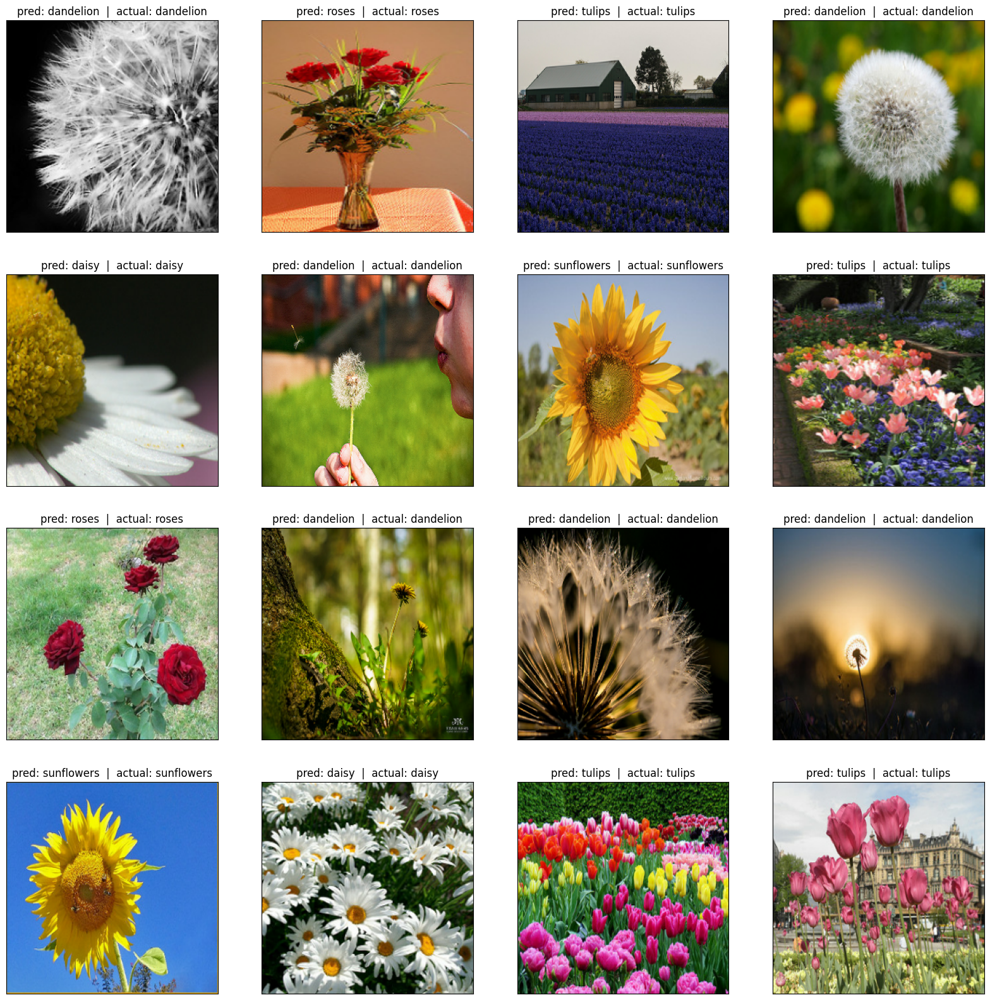

In [76]:
plt.figure(figsize=(20, 20))
for i in range(16):
  plt.subplot(4, 4, i+1)
  plt.imshow(imgs[i].numpy().astype('uint16'))
  plt.title(f"pred: {pred[i]}  |  actual: {actual_labels[i]}")
  plt.xticks([])
  plt.yticks([])
plt.show()